# DeepSDF Approximating Signed Distance Fields Using Deep Neural Networks for Real-time Rendering

The project involves training and fitting small deep neural networks to approximate signed distance fields (SDFs) using Fourier Features. The SDFs are rendered in real-time on Unity with a custom Compute Shader, achieving up to 60 FPS with a two-layer neural network.


This notebook loads a 3D model mesh and samples points on its surface, trains a neural network to approximate the SDF, exports the neural network and its architecture to .TXT file for Unity to load it, and renders the SDF in real-time on Unity using a compute shader.

![](thumbnail.jpg)


## Environment Setup

In [1]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning, append=True)
warnings.filterwarnings("ignore", category=FutureWarning, append=True)

In [2]:
import gc
import os

import numpy as np
import pandas as pd
import trimesh
import mcubes
import mesh_to_sdf
import pyvista as pv
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, models

In [3]:
# set the backend to be used by pyvista
plt.style.use('seaborn-v0_8-dark')
px.defaults.template = 'plotly_dark'
pv.set_plot_theme('dark')
pv.set_jupyter_backend('client')

# 3d coordinates
INPUT_DIM = 3

# dimension of the embedding of the fourier features
EMBEDDING_DIM = 32

# number of sample points (number of training samples)
N_SAMPLE_POINTS = 2_000_000

# the name of the model to be viewed
NN_MODEL_DIR = "NN Models"
filepath = os.path.join("3D Models", "Alexander.obj")
basename = os.path.splitext(os.path.basename(filepath))[0]

# the points to be used for the prediction
# use numpy mesh grid to create the points
RESOLUTION = 256
linspace = np.linspace(-1, 1, RESOLUTION)
points_pred = np.array(np.meshgrid(linspace, linspace, linspace)).T.reshape(-1, 3)

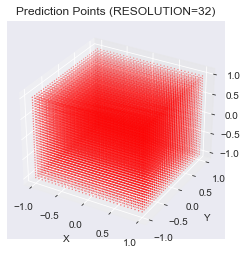

In [4]:
# plot points_pred using matplotlib
# points_pred is a uniform grid of points in the unit cube [-1, 1]^3
# used to predict the SDF values at these points
linspace = np.linspace(-1, 1, 32)
points_pred_plot = np.array(np.meshgrid(linspace, linspace, linspace)).T.reshape(-1, 3)
fig = plt.figure() 
ax = fig.add_subplot(111, projection='3d')

ax.scatter(points_pred_plot[:, 0], points_pred_plot[:, 1], points_pred_plot[:, 2], s=0.1, c='r')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_title('Prediction Points (RESOLUTION=32)')
plt.show()
del points_pred_plot

In [5]:
def get_points_from_file(filepath: str, n_points: int=10000, noise_ratio=0.5):
    # load the mesh
    mesh = trimesh.load_mesh(filepath)
    n_surface_points = int(n_points * (1 - noise_ratio))
    n_noise_points = n_points - n_surface_points

    # scale the mesh to unit sphere and get surface point cloud
    scaled_mesh = mesh_to_sdf.scale_to_unit_sphere(mesh)
    surface_point_cloud = mesh_to_sdf.get_surface_point_cloud(scaled_mesh, calculate_normals=False)
    
    # sample points on the surface and get their distances
    points_on_surface, dists = surface_point_cloud.sample_sdf_near_surface(n_surface_points, sign_method="depth")

    # add noise to the points on surface
    noise = np.random.uniform(-0.5, 0.5, size=(n_noise_points, 3))
    noisy_points_on_surface = points_on_surface+noise
    noisy_dists = surface_point_cloud.get_sdf_in_batches(noisy_points_on_surface, use_depth_buffer=True)

    # sample points uniformly in the unit sphere and get their distances
    uniform_points = np.random.uniform(-1, 1, size=(n_noise_points, 3))
    uniform_dists = surface_point_cloud.get_sdf_in_batches(uniform_points, use_depth_buffer=True)

    # concatenate the points and distances
    # X = np.concatenate([noisy_points_on_surface, uniform_points], axis=0)
    # y = np.concatenate([noisy_dists, uniform_dists], axis=0)
    # return (X, y), (points_on_surface, dists), mesh

    # concatenate the points and distances
    X = np.concatenate([noisy_points_on_surface, uniform_points, points_on_surface], axis=0)
    y = np.concatenate([noisy_dists, uniform_dists, dists], axis=0)

    return (X, y), mesh

def shuffle_data(points, sdf):
    indices = np.arange(len(points))
    np.random.shuffle(indices)
    points = points[indices]
    sdf = sdf[indices]
    return points, sdf

def plot_mesh_using_plotly(mesh):
    # extract vertices and faces
    x, y, z = mesh.vertices[:, 0], mesh.vertices[:, 1], mesh.vertices[:, 2]
    i, j, k = mesh.faces[:, 0], mesh.faces[:, 1], mesh.faces[:, 2]

    # rotate 90 degrees on z axis
    rotation = np.array([[0, -1, 0],[1, 0, 0],[0, 0, 1]])
    x, y, z = np.dot(rotation, np.array([x, y, z]))

    # rotate -45 degrees on y axis
    rotation = np.array([[np.cos(np.pi/4), 0, np.sin(np.pi/4)],[0, 1, 0],[np.sin(-np.pi/4), 0, np.cos(np.pi/4)]])
    x, y, z = np.dot(rotation, np.array([x, y, z]))

    # create the mesh plot
    fig = go.Figure(data=[go.Mesh3d(
        x=x, y=y, z=z,
        i=i, j=j, k=k,
        colorscale='Viridis',
        flatshading=True,
        opacity=0.95, 
        alphahull=0,
        color='lightpink',
        lighting=dict(ambient=0.4,diffuse=1,fresnel=0.1,specular=0.5,roughness=0.5),
        lightposition=dict(x=-0.5,y=-0.5,z=-0.5,)
    )])

    fig.show()

## Loading Meshes & Generating Data Samples

In [6]:
(points, dists), mesh = get_points_from_file(
    filepath,
    n_points=N_SAMPLE_POINTS
)

print(points.min(), points.max(), points.shape)
print(dists.min(), dists.max(), dists.shape)

-1.4753147390555714 1.4763364974648372 (3000000, 3)
-0.37582046 1.2708414 (3000000,)


In [7]:
# plot the sampled points (training data)
sampled_df = pd.DataFrame()
random_sample_mask = np.random.choice(points.shape[0], 50_000, replace=False)
sampled_df['x'] = points[random_sample_mask][:, 0]
sampled_df['y'] = points[random_sample_mask][:, 1]
sampled_df['z'] = points[random_sample_mask][:, 2]
sampled_df['c'] = (dists[random_sample_mask]<0)
sampled_df['Point Location'] = sampled_df['c'].apply(lambda x: 'Outside' if x else 'Inside')

color_discrete_map = {False: 'white', True: 'blue'}
fig = px.scatter_3d(
    sampled_df, 
    x='x', y='z', z='y', 
    width=512, height=512, opacity=0.34,
    color='Point Location', color_discrete_sequence=color_discrete_map
)
fig.update_traces(marker_size=1)
fig.update_layout(legend=dict(itemsizing='constant'))
fig.update_layout(title_text='Sampled Points (noise + in/out surface)')
fig.update_layout(legend=dict(yanchor="top", y=0.99, xanchor="right", x=0.99))
fig.show()

In [8]:
# plot the mesh using pyvista
filepath = os.path.join("3D Models", "Alexander.obj")
mesh = trimesh.load_mesh(filepath)
pv_mesh = pv.wrap(mesh)

# rotate the mesh 90 on the z axis
pv_mesh.rotate_z(90, inplace=True)
pv_mesh.rotate_y(45, inplace=True)
pv_mesh.plot()

Widget(value='<iframe src="http://localhost:58829/index.html?ui=P_0x1e4f2c78850_0&reconnect=auto" class="pyvis…

## Training DNN Model

In [9]:
class FourierFeatures(tf.keras.layers.Layer):
    counter = 0
    def __init__(self, input_dim, mapping_dim, scale=1.0):
        super(FourierFeatures, self).__init__()
        self.input_dim = input_dim
        self.mapping_dim = mapping_dim
        self.scale = scale
        self.kernel = self.add_weight(
            shape=(input_dim, mapping_dim // 2),
            initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=scale),
            trainable=False,
            name=f'fourier_features_{FourierFeatures.counter}'
        )
        self.alpha = self.add_weight(
            shape=(1,),
            initializer=tf.keras.initializers.Ones(),
            trainable=True
        )
        FourierFeatures.counter += 1

    def call(self, x):
        x_proj = tf.matmul(x, self.kernel * self.alpha)
        x_proj = 2.0 * np.pi * x_proj
        return tf.concat([tf.sin(x_proj), tf.cos(x_proj)], axis=-1)
    
    def get_config(self):
        return {
            'input_dim': self.input_dim,
            'mapping_dim': self.mapping_dim,
            'scale': self.scale
        }

# define the model
model = models.Sequential([
    layers.InputLayer(input_shape=(INPUT_DIM,)),
    FourierFeatures(INPUT_DIM, EMBEDDING_DIM),
    layers.Dense(16, activation='relu'),
    layers.Dense(16, activation='relu'),
    layers.Dense(1)
])

architecture_text = f"FF{EMBEDDING_DIM}_"+"_".join(f"D{l.bias.shape[0]}" for l in model.layers[1:])

# use the learning rate schedule
BATCH_SIZE = 1<<15
EPOCHS = 600
STEPS_PER_EPOCH = len(points) // BATCH_SIZE

# learning rate schedule
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.003,
    decay_steps=STEPS_PER_EPOCH*5,
    decay_rate=0.96,
    staircase=True
)

# plot lr schedule
lr_values = [lr_schedule(i).numpy() for i in range(STEPS_PER_EPOCH*EPOCHS)]
fig = go.Figure()
fig.add_trace(go.Scatter(x=np.arange(STEPS_PER_EPOCH*EPOCHS), y=lr_values, mode='lines'))
fig.update_layout(title='Learning Rate Schedule', xaxis_title='Step', yaxis_title='Learning Rate')
fig.show()

optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)
model.compile(optimizer=optimizer, loss='mse')

# print the model summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 fourier_features (FourierFe  (None, 32)               49        
 atures)                                                         
                                                                 
 dense (Dense)               (None, 16)                528       
                                                                 
 dense_1 (Dense)             (None, 16)                272       
                                                                 
 dense_2 (Dense)             (None, 1)                 17        
                                                                 
Total params: 866
Trainable params: 818
Non-trainable params: 48
_________________________________________________________________


In [ ]:
# # fourier features represent high and low frequency patterns in the input data
# # the fourier features are used to learn the SDF function
# # visualize the fourier features signals in the input space

# subset = np.random.choice(points.shape[0], 5_000, replace=False)
# subset = points[subset]
# # get the fourier features of the points
# fourier_features = model.layers[0](subset)
# fourier_features = fourier_features.numpy()

# # plot the fourier features
# fig = plt.figure(figsize=(20, 20))
# for i in range(8*8):
#     ax = fig.add_subplot(8, 8, i+1, projection='3d')
#     ax.scatter(subset[:, 0], subset[:, 1], subset[:, 2], c=fourier_features[:, i], s=0.1, label=f'FF{i}', cmap='viridis')
#     ax.axis('off')
#     ax.legend()

# plt.legend()
# plt.tight_layout()
# plt.show()


In [10]:
# add a callback to save the best checkpoint
best_checkpoint_filepath = os.path.join(NN_MODEL_DIR, f"{basename}_{architecture_text}_checkpoint.keras")
best_checkpoint_cb = tf.keras.callbacks.ModelCheckpoint(
    filepath=best_checkpoint_filepath,
    save_best_only=True,
    monitor='loss',
    mode='min',
)

# train the model
points, dists = shuffle_data(points, dists)
history = model.fit(
    points, dists, 
    batch_size=BATCH_SIZE, epochs=EPOCHS, 
    callbacks=[best_checkpoint_cb],
    verbose=1
)

# load the best chcekpoint model
model = models.load_model(best_checkpoint_filepath, custom_objects={'FourierFeatures': FourierFeatures})

# plot training history using plotly
history_df = pd.DataFrame(history.history)
history_df['epoch'] = history.epoch

fig = px.line(history_df, x='epoch', y='loss', width=512, height=512, title='Training History')
fig.show()

Epoch 1/600
92/92 [==============================] - 3s 6ms/step - loss: 0.0443
Epoch 2/600
92/92 [==============================] - 0s 5ms/step - loss: 0.0092
Epoch 3/600
92/92 [==============================] - 0s 5ms/step - loss: 0.0023
Epoch 4/600
92/92 [==============================] - 0s 5ms/step - loss: 0.0012
Epoch 5/600
92/92 [==============================] - 0s 5ms/step - loss: 7.8853e-04
Epoch 6/600
92/92 [==============================] - 0s 5ms/step - loss: 6.2512e-04
Epoch 7/600
92/92 [==============================] - 0s 5ms/step - loss: 5.3065e-04
Epoch 8/600
92/92 [==============================] - 0s 5ms/step - loss: 4.6094e-04
Epoch 9/600
92/92 [==============================] - 0s 5ms/step - loss: 4.0725e-04
Epoch 10/600
92/92 [==============================] - 0s 5ms/step - loss: 3.6493e-04
Epoch 11/600
92/92 [==============================] - 0s 5ms/step - loss: 3.3200e-04
Epoch 12/600
92/92 [==============================] - 0s 5ms/step - loss: 3.0503e-04
Epoch

## Making Predictions

In [11]:
gc.collect()

sample_points_pred = points_pred
dists_pred = model.predict(sample_points_pred, batch_size=1<<18)
print(dists_pred.min(), dists_pred.max(), dists_pred.shape)
is_inside = dists_pred < 0
mask = is_inside.reshape(-1)
points_inside = np.array(sample_points_pred[mask])
print(points_inside.shape)

64/64 [==============================] - 1s 5ms/step
-0.33035818 1.1646823 (16777216, 1)
(1652554, 3)


In [20]:
# plot predictions 
sampled_df = pd.DataFrame()
random_sample_mask = np.random.choice(points_inside.shape[0], 25_000, replace=False)
sampled_df['x'] = points_inside[random_sample_mask][:, 0]
sampled_df['y'] = points_inside[random_sample_mask][:, 1]
sampled_df['z'] = points_inside[random_sample_mask][:, 2]
sampled_df['Distance'] = dists_pred[random_sample_mask]

fig = px.scatter_3d(sampled_df, x='x', y='z', z='y', width=500, height=500, opacity=0.3, color='Distance')
fig.update_traces(marker_size=1)
fig.update_layout(title_text='DNN SDF Predictions')
fig.show()

## Exporting Predictions to .OBJ

In [13]:
voxels = is_inside.reshape((RESOLUTION,RESOLUTION,RESOLUTION)).T

# uncomment to smooth
voxels = mcubes.smooth(voxels)

verts, tris = mcubes.marching_cubes(voxels, 0.5)
output_filepath = os.path.join(os.path.dirname(filepath), f"predicted_{basename}.obj")
mcubes.export_obj(verts, tris, output_filepath)

# create a mesh from verts and tris
estimated_mesh = trimesh.Trimesh(vertices=verts, faces=tris)

In [14]:
def align_camera_to_mesh(plotter, mesh):
    bounds = np.array(mesh.bounds).flatten()
    center = [(bounds[1] + bounds[0]) / 2,
                (bounds[3] + bounds[2]) / 2,
                (bounds[5] + bounds[4]) / 2]
    plotter.camera_position = 'xy'
    plotter.camera.focal_point = center
    plotter.camera.position = [center[0], center[1], (center[2] + (bounds[5] - bounds[4])) * 5]
    plotter.camera.view_up = [0, 1, 0]

def center_mesh(mesh):
    bounds = np.array(mesh.bounds).flatten()
    center = [(bounds[1] + bounds[0]) / 2,
              (bounds[3] + bounds[2]) / 2,
              (bounds[5] + bounds[4]) / 2]
    translation = -np.array(center)
    if isinstance(mesh, trimesh.Trimesh):
        mesh.apply_translation(translation)
    elif isinstance(mesh, pv.PolyData):
        mesh.translate(translation, inplace=True)
    return mesh

pv.set_plot_theme('dark')
plotter = pv.Plotter(shape=(1, 2))
mesh1 = pv.wrap(center_mesh(estimated_mesh))
mesh2 = pv.wrap(center_mesh(mesh))

# mesh1.rotate_z(-45, inplace=True)
# mesh1.rotate_y(90, inplace=True)

plotter.subplot(0, 0)
plotter.add_mesh(mesh1, color='lightgray')
plotter.add_text(f"Approximated Mesh\n{architecture_text}", position='upper_right', font_size=14, color="white")
align_camera_to_mesh(plotter, mesh1)

plotter.subplot(0, 1)
plotter.add_mesh(mesh2, color='lightyellow')
plotter.add_text("Original Mesh", position='upper_right', font_size=14, color="white")
align_camera_to_mesh(plotter, mesh2)

# plotter.link_views()
plotter.show()

Widget(value='<iframe src="http://localhost:58829/index.html?ui=P_0x1e4f2d3d640_1&reconnect=auto" class="pyvis…

## Exporting DNN Weights

### Exporting as a Keras Model

In [ ]:
# saving the model as a keras model
# the model is already saved during training
# because of the save best checkpoint callback
# model.save(best_checkpoint_filepath)

# to load the model
# model = models.load_model(best_checkpoint_filepath, custom_objects={'FourierFeatures': FourierFeatures})

### Exporting Weights as .TXT file (for Unity)

In [15]:
# exporting model weights as a text file
model_weights_filepath = os.path.join(NN_MODEL_DIR, f"{basename}_{architecture_text}_weights.unity.txt")
with open(model_weights_filepath, "w+") as f:
    fourier = model.layers[0].kernel.numpy() * model.layers[0].alpha.numpy()[0]
    fourier = fourier.reshape(-1)
    f.write(f"{','.join([str(i) for i in fourier])}\n")
    print(fourier.shape)

    for layer in model.layers[1:]:
        if not isinstance(layer, tf.keras.layers.Dense):
            raise ValueError("Invalid layer type")
        w, b = layer.get_weights()
        w, b = w.T.reshape(-1), b.reshape(-1)
        l = np.hstack([w, b])
        print(l.shape)
        f.write(f"{','.join([str(i) for i in l])}\n")

(48,)
(528,)
(272,)
(17,)


### Generating .GLSL Compute Shader Function for the Approximated SDF

In [ ]:
# _vec4 = lambda v: f"vec4({v[0]}, {v[1]}, {v[2]}, {v[3]})"
# _mat3x4 = lambda m: f"mat3x4({_vec4(m[0])}, {_vec4(m[1])}, {_vec4(m[2])})"
# _mat4x4 = lambda m: f"mat4x4({_vec4(m[0])}, {_vec4(m[1])}, {_vec4(m[2])}, {_vec4(m[3])})"
# _float = lambda v: f"{v}"
# _get_vec_projection_statement = lambda name, matrix, input_var: f"vec4 {name} = {matrix} * {input_var};"
# _get_dot_projection_statement = lambda name, matrix, input_var: f"float {name} = dot({matrix}, {input_var});"

# def _get_activation_statement(name, input_var, activation_type="relu"):
#     if activation_type == "relu":
#         return f"vec4 {name} = max({input_var}, 0.0);"
#     elif activation_type == "sigmoid":
#         return f"vec4 {name} = 1.0f / (1.0f + exp(-({input_var})));"
#     else:
#         raise ValueError("Uncreognized activation type.")

# def serialize_fourier_features(mapping, alpha, input_var, idx):
#     # return objects initialization.
#     sin_vars, cos_vars = [], []
#     statements = []

#     output_submatrix_count = mapping.shape[1] // 4
#     for o in range(output_submatrix_count):
#         # set up output variable names.
#         sin_var_name = f"x_{idx}_{o}"
#         cos_var_name = f"x_{idx}_{o + output_submatrix_count}"

#         # create matmul statement.
#         m = mapping[:, o * 4 : (o + 1) * 4]  # 3x4
#         m = m * alpha * 2.0 * np.pi
#         projection = _get_vec_projection_statement(
#             f"x_pj_{o}",
#             _mat3x4(m),
#             input_var,
#         )
#         sin_output = f"vec4 {sin_var_name} = sin(x_pj_{o});"
#         cos_output = f"vec4 {cos_var_name} = cos(x_pj_{o});"

#         # update output vars.
#         statements += [projection, sin_output, cos_output]
#         sin_vars += [sin_var_name]
#         cos_vars += [cos_var_name]

#     # concatenate sine and cosine output vars.
#     output_vars = sin_vars + cos_vars
#     return output_vars, statements

# def serialize_4x4_layer(weight, bias, input_vars, idx, activation_type="relu"):
#     # return objects initialization.
#     output_vars, statements = [], []

#     output_submatrices_count = weight.shape[0] // 4
#     for o in range(output_submatrices_count):
#         submatrix_outputs = []
#         for i, input_var in enumerate(input_vars):
#             # set up variable names.
#             submatrix_output_name = f"x_{idx}_{o}_{i}"

#             # create matmul statement.
#             m = weight[o * 4 : (o + 1) * 4, i * 4 : (i + 1) * 4]
#             projection_statement = _get_vec_projection_statement(
#                 submatrix_output_name, _mat4x4(m.transpose(1, 0)), input_var
#             )

#             statements += [projection_statement]
#             submatrix_outputs += [submatrix_output_name]

#         # create activation statement.
#         b = bias[o * 4 : (o + 1) * 4]
#         pre_activation_sum = "+".join(submatrix_outputs + [_vec4(b)])
#         output_name = f"x_{idx}_{o}"
#         activation_statement = _get_activation_statement(
#             output_name, pre_activation_sum, activation_type
#         )

#         statements += [activation_statement]
#         output_vars += [output_name]

#     return output_vars, statements

# def serialize_4x1_layer(weight, bias, input_vars, idx):
#     # return objects initialization.
#     statements = []

#     submatrix_outputs = []
#     for i, input_var in enumerate(input_vars):
#         # set up variable names
#         submatrix_output_name = f"x_{idx}_0_{i}"

#         # create matmul statement
#         m = weight[i * 4 : (i + 1) * 4, 0]
#         projection = _get_dot_projection_statement(
#             submatrix_output_name, _vec4(m), input_var
#         )

#         statements += [projection]
#         submatrix_outputs += [submatrix_output_name]

#     # create output sum statement
#     b = bias[0]
#     output_sum = "+".join(submatrix_outputs + [_float(b)])
#     output_name = f"x_{idx}"
#     output_statement = f"float {output_name} = {output_sum};"

#     statements += [output_statement]
#     return [output_name], statements

# def get_glsl_string(model):
#     # get lists of weights and biases.
#     weights = [layer.kernel.numpy() for layer in model.layers[1:]]
#     biases = [layer.bias.numpy() for layer in model.layers[1:]]

#     # set activation type from model.
#     activation_type = "relu"

#     # the input layer has to be FourierFeatures layer.
#     fourier_mapping = model.layers[0].kernel.numpy()
#     fourier_alpha = model.layers[0].alpha[0]

#     statements = []
#     module_idx = 0

#     # generate code for FourierFeatures layer.
#     output_vars, stmts = serialize_fourier_features(
#         fourier_mapping, fourier_alpha, "x", module_idx
#     )
#     module_idx += 1
#     statements += stmts

#     # generate code for hidden layers.
#     for w, b in zip(weights[:-1], biases[:-1]):
#         output_vars, stmts = serialize_4x4_layer(
#             w, b, output_vars, module_idx, activation_type
#         )
#         module_idx += 1
#         statements += stmts

#     # generate code for the output layer.
#     output_vars, stmts = serialize_4x1_layer(
#         weights[-1], biases[-1], output_vars, module_idx
#     )
#     statements += stmts

#     # return statement.
#     return_statement = f"return {output_vars[0]};"
#     statements += [return_statement]

#     return statements

# def save_as_glsl_compute_shader(model, output_filepath):
#     statements = get_glsl_string(model)
#     separator = "\n    "
#     output = ""
#     output += "float nn_sdf(vec3 x) {"
#     output += separator + separator.join(statements)
#     output += "}"

#     with open(output_filepath, "w+") as f:
#         f.write(output)

# # save the model as a glsl compute shader
# glsl_compute_shader_filepath = os.path.join(os.path.dirname(filepath), f"{basename}_model.glsl")
# save_as_glsl_compute_shader(model, glsl_compute_shader_filepath)